In [0]:
import torch
import numpy as np
import time
import torchvision
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data.sampler import SubsetRandomSampler
import matplotlib.pyplot as plt
from PIL import Image, ImageOps

#mount Google Drive
from google.colab import drive
drive.mount('/content/gdrive', True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
#resize and black pad images to 224x224 with no distortion
def cleaner(file):
    #resize image while keeping aspect ratio (e.g. 500x375 becomes 224x168)
    x = 224
    y = 224
    image = Image.open(file).convert("RGB")
    image.thumbnail((x, y), Image.ANTIALIAS)

    #add symmetrical black padding to the smaller dimension to match the desired x and y
    deltaX = x - image.size[0]
    deltaY = y - image.size[1]
    padding = (deltaX//2, deltaY//2, deltaX-(deltaX//2), deltaY-(deltaY//2))

    return ImageOps.expand(image, padding)

#load images from Google Drive
def loadImages(folder):
    #transform to tensor and normalize
    transform = transforms.Compose([transforms.ToTensor(), 
                                    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                    std=[0.229, 0.224, 0.225])])

    #load data from Google Drive and clean them as they load
    dataset = torchvision.datasets.ImageFolder(root=folder, loader=cleaner, transform=transform)
    
    return dataset

#verify that the images have been loaded and labeled
def verifyImages(dataset):
    #prepare dataloader
    dataLoader = torch.utils.data.DataLoader(dataset, batch_size=6, num_workers=1, shuffle=True)

    #verification step - obtain one batch of images
    dataiter = iter(dataLoader)
    images, labels = dataiter.next()
    images = images.numpy() #convert images to numpy for display
    classes = ["Cloud", "Sun", "Rain", "Snow", "Fog"]

    #plot the images in the batch, along with the corresponding labels
    fig = plt.figure(figsize=(25, 4))
    for idx in np.arange(6):
        ax = fig.add_subplot(2, 20/2, idx+1, xticks=[], yticks=[])
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        picture = np.transpose(images[idx], (1, 2, 0))
        picture = std * picture + mean
        picture = np.clip(picture, 0, 1)
        plt.imshow(picture)
        ax.set_title(classes[labels[idx]])

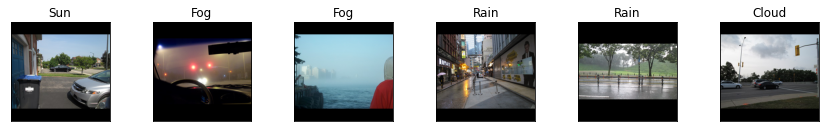

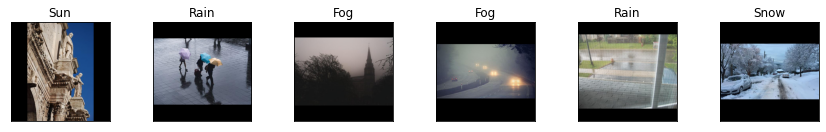

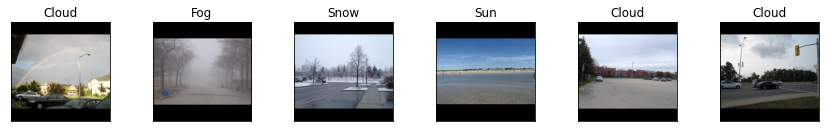

In [0]:
imagePath = "/content/gdrive/My Drive/Colab Notebooks/ProjectData/FinalData/"
testingImages = loadImages(imagePath + "Testing")
verifyImages(testingImages)
finalImages = loadImages(imagePath + "FinalTesting")
verifyImages(finalImages)
liveImages = loadImages(imagePath + "LiveTesting")
verifyImages(liveImages)

In [0]:
import os
import torchvision.models
resnet50 = torchvision.models.resnet50(pretrained=True) #load ResNet50
if torch.cuda.is_available():
    resnet50 = resnet50.cuda()

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/checkpoints/resnet50-19c8e357.pth


In [0]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
modelPath = "/content/gdrive/My Drive/Colab Notebooks/ProjectData/FinalData/"

cloudNet = torchvision.models.resnet50(pretrained=True).to(device)
for param in cloudNet.parameters():
    param.requires_grad = False   
cloudNet.fc = nn.Sequential(
               nn.Linear(2048, 32),#3208
               nn.ReLU(inplace=True),
               nn.Linear(32, 2)).to(device)
cloudNet.load_state_dict(torch.load(modelPath + "CloudNet"))
cloudNet.eval();

sunNet = torchvision.models.resnet50(pretrained=True).to(device)
num_ftrs = sunNet.fc.in_features
sunNet.fc = nn.Sequential(
    nn.Linear(num_ftrs, 1024),
    nn.ReLU(),
    nn.Linear(1024, 512),
    nn.ReLU(),
    nn.Linear(512, 2)
).to(device)
sunNet.load_state_dict(torch.load(modelPath + "SunNet"))
sunNet.eval();

rainNet = torchvision.models.resnet50(pretrained=True).to(device)
for param in rainNet.parameters():
    param.requires_grad = False      
rainNet.fc = nn.Sequential(
               nn.Linear(2048, 1000),
               nn.ReLU(inplace=True),
               nn.Linear(1000, 2)).to(device)
rainNet.load_state_dict(torch.load(modelPath + "RainNet"))
rainNet.eval();

class SnowNet(nn.Module):
    def __init__(self, fcSize, getFeatures=True):
        self.size = fcSize
        self.getFeatures = getFeatures
        super(SnowNet, self).__init__()
        self.fc1 = nn.Linear(1000, self.size)
        self.fc2 = nn.Linear(self.size, self.size//2)
        self.fcf = nn.Linear(self.size//2, 1)

    def forward(self, x):
        if self.getFeatures:
            x = resnet50(x)
        x = x.view(-1, 1000)
        x = F.leaky_relu(self.fc1(x))
        x = F.leaky_relu(self.fc2(x))
        x = self.fcf(x)
        return x.squeeze(1)
snowNet = SnowNet(750)
if torch.cuda.is_available():
    snowNet = snowNet.cuda()
snowNet.load_state_dict(torch.load(modelPath + "SnowNet"))

fogNet = torchvision.models.resnet50(pretrained=True).to(device)
for p in fogNet.parameters():
    p.requires_grad = False
num_ftrs = fogNet.fc.in_features
fogNet.fc = nn.Sequential(
    nn.Linear(num_ftrs, 1024),
    nn.ReLU(),
    nn.Linear(1024, 512),
    nn.ReLU(),
    nn.Linear(512, 2)
).to(device)
fogNet.load_state_dict(torch.load(modelPath + "FogNet"))
fogNet.eval();

In [0]:
#final evaluation with all five models
def finalEvaluation(loader):
    totalAcc = 0
    confusionMatrix = []
    for i in range(5):
        confusionMatrix.append([0]*5)
    totalEpoch = 0
    softmax = nn.Softmax(dim=1)
    sigmoid = nn.Sigmoid()
    storedLabels = []
    predictions = []
    images = []

    for data in loader: #single batch size
        #get the inputs
        inputs, labels = data

        images.append(inputs.numpy()) #convert images to numpy for display
        
        if torch.cuda.is_available():
            inputs = inputs.cuda()
            labels = labels.cuda()

        #get the predictions
        outputs = [softmax(cloudNet(inputs)).squeeze(),
                   softmax(sunNet(inputs)).squeeze(),
                   softmax(rainNet(inputs)).squeeze(),
                   sigmoid(snowNet(inputs)).squeeze(),
                   softmax(fogNet(inputs)).squeeze()]

        #evaluate the accuracy
        preds = [outputs[0][0].item(),
                 outputs[1][1].item(),
                 outputs[2][1].item(),
                 outputs[3].item(),
                 outputs[4][0].item()]
        pred = preds.index(max(preds))
        confusionMatrix[labels.item()][pred] += 1

        totalEpoch += 1
        storedLabels.append(labels)
        predictions.append(preds)

        #print a row of images with label and predictions
        if len(storedLabels) == 10:
            classes = ["Cl", "Su", "Ra", "Sn", "Fo"]
            #plot the pictures, labels and if the model got it right
            fig = plt.figure(figsize=(25,  4 * (len(storedLabels)//10+1)))
            for idx in range(len(storedLabels)):
                ax = fig.add_subplot(len(storedLabels)//10+1, 10, idx+1, xticks=[], yticks=[])
                mean = np.array([0.485, 0.456, 0.406])
                std = np.array([0.229, 0.224, 0.225])
                picture = np.transpose(images[idx][0], (1, 2, 0))
                picture = std * picture + mean
                picture = np.clip(picture, 0, 1)
                plt.imshow(picture)
                ax.set_title(classes[storedLabels[idx]] + 
                            " Cl{} Su{}\nRa{} Sn{} Fo{}".format(round(predictions[idx][0] * 100), 
                                                                round(predictions[idx][1] * 100), 
                                                                round(predictions[idx][2] * 100), 
                                                                round(predictions[idx][3] * 100),
                                                                round(predictions[idx][4] * 100)))
            storedLabels = []
            predictions = []
            images = []

    #print any remaining pictures
    if len(storedLabels) >= 1:
        classes = ["Cl", "Su", "Ra", "Sn", "Fo"]
        #plot the pictures, labels and if the model got it right
        fig = plt.figure(figsize=(25,  4 * (len(storedLabels)//10+1)))
        for idx in range(len(storedLabels)):
            ax = fig.add_subplot(len(storedLabels)//10+1, 10, idx+1, xticks=[], yticks=[])
            mean = np.array([0.485, 0.456, 0.406])
            std = np.array([0.229, 0.224, 0.225])
            picture = np.transpose(images[idx][0], (1, 2, 0))
            picture = std * picture + mean
            picture = np.clip(picture, 0, 1)
            plt.imshow(picture)
            ax.set_title(classes[storedLabels[idx]] + 
                        " Cl{} Su{}\nRa{} Sn{} Fo{}".format(round(predictions[idx][0] * 100), 
                                                            round(predictions[idx][1] * 100), 
                                                            round(predictions[idx][2] * 100), 
                                                            round(predictions[idx][3] * 100),
                                                            round(predictions[idx][4] * 100)))
    #show final statistics
    for row in confusionMatrix:
        print(row)

    totalCorrect = 0
    for i in range(5):
        totalCorrect += confusionMatrix[i][i]
    print("Final accuracy:", totalCorrect / totalEpoch)

[1, 0, 0, 0, 0]
[0, 1, 0, 0, 0]
[0, 0, 1, 0, 1]
[0, 0, 0, 1, 0]
[0, 1, 0, 0, 1]
Final accuracy: 0.7142857142857143


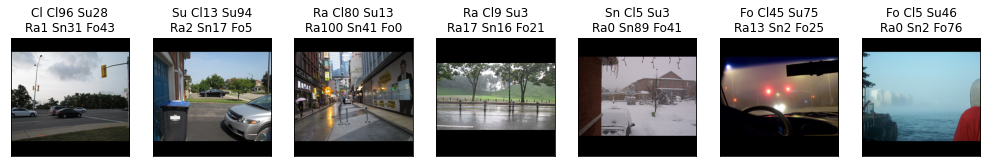

In [0]:
testingLoader = torch.utils.data.DataLoader(testingImages, batch_size=1, num_workers=1, shuffle=False)
finalEvaluation(testingLoader)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:47: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


[68, 15, 5, 4, 8]
[15, 77, 2, 3, 3]
[13, 2, 48, 16, 21]
[1, 2, 5, 71, 21]
[3, 2, 0, 2, 93]
Final accuracy: 0.714


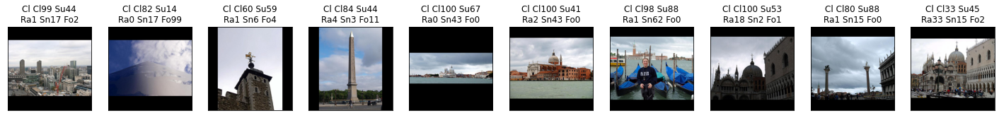

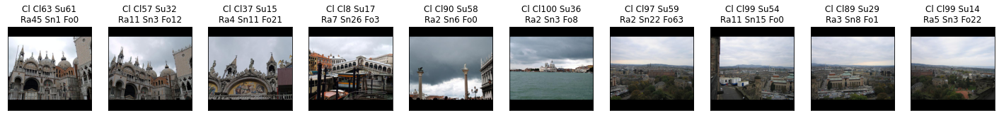

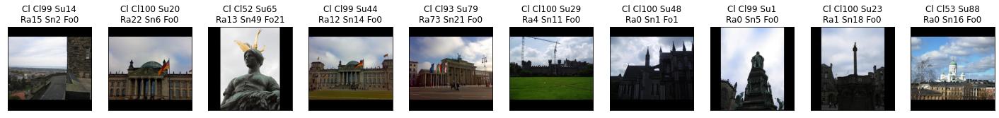

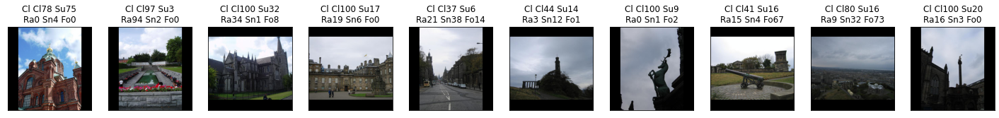

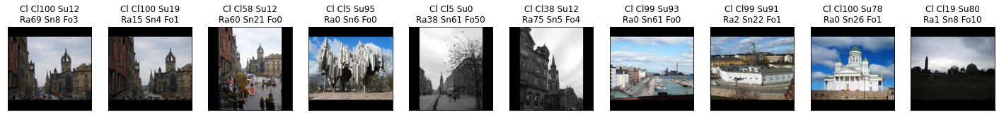

...

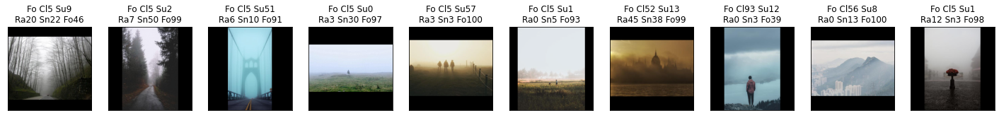

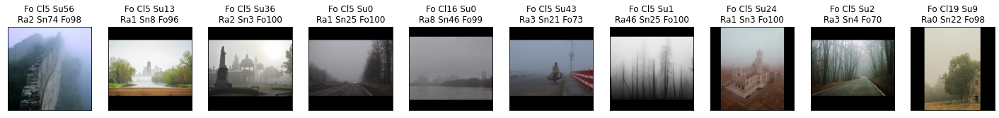

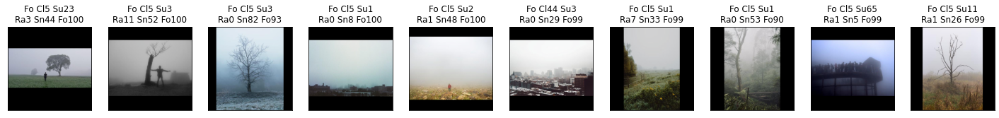

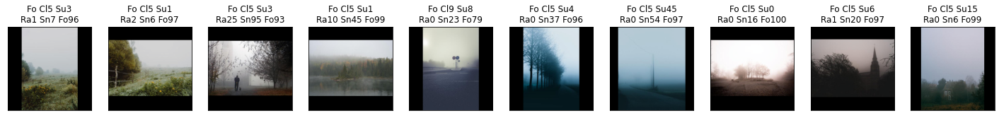

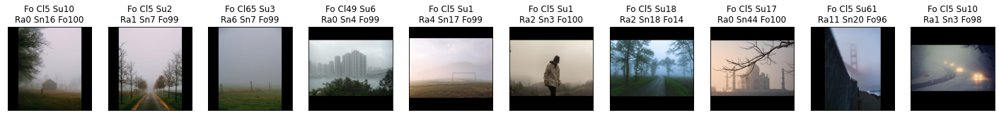

In [0]:
finalLoader = torch.utils.data.DataLoader(finalImages, batch_size=1, num_workers=1, shuffle=False)
finalEvaluation(finalLoader)

[7, 0, 0, 1, 2]
[0, 7, 2, 0, 1]
[1, 0, 5, 0, 4]
[0, 0, 0, 7, 3]
[0, 1, 0, 0, 9]
Final accuracy: 0.7


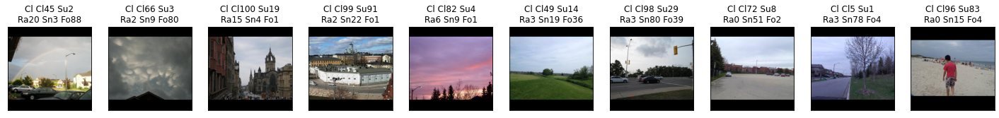

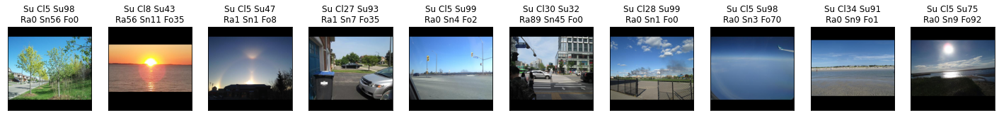

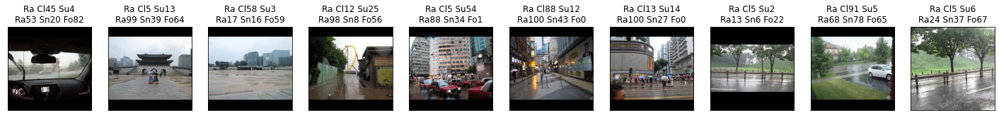

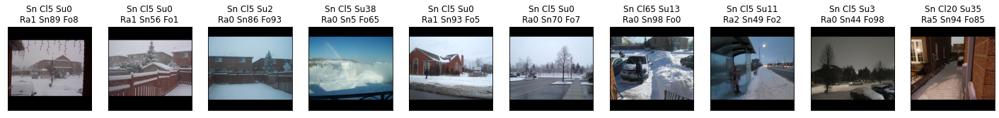

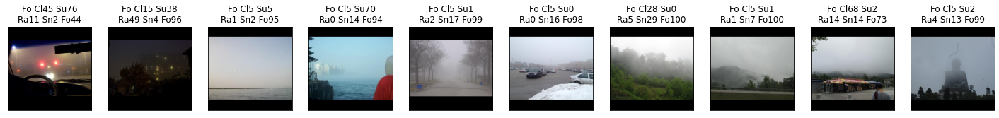

In [0]:
liveLoader = torch.utils.data.DataLoader(liveImages, batch_size=1, num_workers=1, shuffle=False)
finalEvaluation(liveLoader)